In [ ]:
# Jupyter Notebook options

# Set the maximum number of rows to print from dplyr functions
options(dplyr.print_max = 10)

# Set the default plot width for Jupyter Notebook display
options(repr.plot.width = 12, repr.plot.height = 8)

# Daten visualisieren

> Disclaimer: wie in der ersten Übung beschrieben, orientiert sich dieses Notebook einer [Einführung in R](https://xvariable.github.io/r_book/intro.html) von Julia Niemann-Lenz sowie dem Buch [R for Data Science](https://r4ds.hadley.nz/) von Hadley Wickham, Mine Çetinkaya-Rundel und Garrett Grolemund. R4DS ist lizenziert unter der [CC BY-NC-ND 3.0 License](https://creativecommons.org/licenses/by-nc-nd/3.0/us/). (*Wickham, H., Çetinkaya-Rundel, M., & Grolemund, G. (2023). R for data science. " O'Reilly Media, Inc.". [Online-Präsenz](https://r4ds.hadley.nz/))*. Die Aufgaben 13 & 14 in diesem Notebook kommen aus R4DS.

In dieser Session werden wir erste Methoden kennenlernen, mit denen wir Daten in R grafisch darstellen (visualisieren) können. Grafiken erfüllen bei der Datenanalyse zwei sehr wichtige Funktionen: Zum einen dienen sie der Exploration (also der Erkundung) der Daten und helfen dabei, selbst ein besseres Verständnis für die eigenen Daten zu entwickeln. Zum anderen dienen Grafiken aber auch dazu, die Ergebnisse der eigenen Analyse darzustellen um sie anderen mitzuteilen. Das funktioniert gut, weil Menschen Informationen, die grafisch aufbereitet wurden, besonders schnell und ganzheitlich erfassen. Grafiken können deshalb beim Vermitteln von Informationen mit Daten extrem nützlich sein. Weil wir alle schon viel Erfahrung mit grafisch dargestellten Statiken haben, sind Grafiken ein guter Startpunkt.

> "The simple graph has brought more information to the data analyst's mind than any other device." --- John Tukey

R verfügt über mehrere Systeme zur Erstellung von Grafiken. Wir wollen in dieser Übung das R-package [`ggplot2`](https://ggplot2.tidyverse.org/) für die Visualisierung von Daten nutzen. [`ggplot2`](https://ggplot2.tidyverse.org/) beruht auf der *Grammar of Graphics*  (mehr zum Hintergrund findest du [hier](http://vita.had.co.nz/papers/layered-grammar.pdf)). Die Idee dahinter ist, dass eine Grafik aus mehreren Elementen zusammengesetzt ist. Diese sind die „Stellschrauben“, mit denen man am Aussehen der Grafik drehen kann.

<img src="https://ggplot2.tidyverse.org/logo.png" alt="ggplot2" width="100" align="right" />

Das Paket [`ggplot2`](https://ggplot2.tidyverse.org/) ist im Paket [`tidyverse`](https://www.tidyverse.org/) enthalten, daher laden wir zunächst das nötige Package mit [`pacman`](https://www.rdocumentation.org/packages/pacman/versions/0.5.1) (siehe vorherige Übung). [`tidyverse`](https://www.tidyverse.org/) benutzen wir in diesem Kurs eigentlich immer bei der Datenanalyse. Ein Paket muss nur einmal installiert werden, aber bei jeder neuen Session neu geladen werden. Außerdem benutzen wir in dieser Übung das Paket [`palmerpenguins`](https://allisonhorst.github.io/palmerpenguins/), welches wir ebenfalls über [`pacman`](https://www.rdocumentation.org/packages/pacman/versions/0.5.1) installieren und gleichzeitig laden können.

Um die Pakete zu laden, müsst ihr die folgende Zelle ausführen (wie gewohnt mit (Ctrl) + (Enter) auf Windows oder (Cmd) + (Enter) auf macOS).

In [ ]:
# wir benutzen pacman, um die notwendigen Pakete zu laden
pacman::p_load(tidyverse,     # für die Datenanalyse
               palmerpenguins # für die Daten
              )

## Erste Schritte

<img src="https://allisonhorst.github.io/palmerpenguins/logo.png" alt="Logo von dplyr" width="100" align=right />

In dieser Übung wollen wir den Datensatz [`palmerpenguins`](https://allisonhorst.github.io/palmerpenguins/) erkunden. Ein Datensatz (engl. *dataframe*) in R ist eine einfache, rechteckige Tabelle mit Variablen in *columns* (Spalten) und Beobachtungen in *rows* (Reihen), ähnlich wie wir sie aus Excel kennen. Der dataframe `penguins`(aka `palmerpenguins::penguins`) beinhaltet Messdaten von Pinguinen, die von Dr. Kristen Gorman und der Palmer Station Antarctica LTER gesammelt wurden.

> Quelle: (Horst AM, Hill AP, Gorman KB (2020). palmerpenguins: Palmer Archipelago (Antarctica) penguin data. R package version 0.1.0. https://allisonhorst.github.io/palmerpenguins/. doi: 10.5281/zenodo.3960218.)

<div align="right"><a href="https://allisonhorst.com/allison-horst">Artwork by @allison_horst</a></div>

* Eine **Variable** ist eine qualitative oder quantitative Eigenschaft, die gemessen werden kann.
* Ein **Wert** ist der Zustand einer Variable, wenn sie gemessen wird (dieser kann sich von Messung zu Messung verändern).
* Ein **Fall** ist eine Sammlung von Messungen, die unter gleichartigen Bedingungen gemacht wurde (z. B. zur gleichen Zeit und am gleichen Objekt). Ein Fall enthält mehrere Werte, von denen jeder mit einer Variable assoziiert ist.

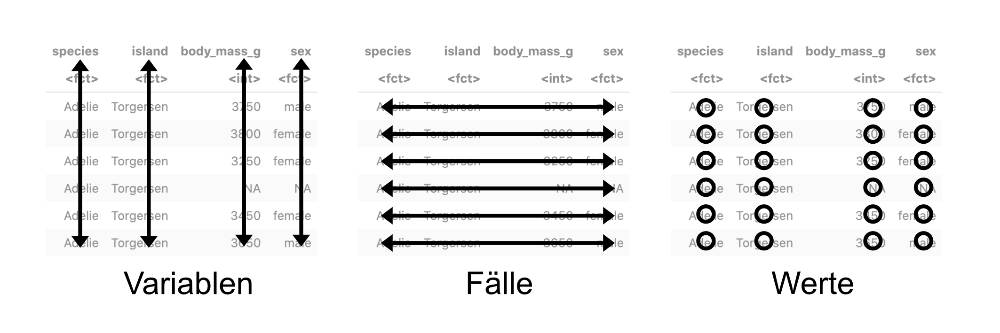
Angelehnt an [R4DS](https://r4ds.hadley.nz/data-tidy#fig-tidy-structure)

In R dataframes und in vielen anderen Statistikprogrammen repräsentiert jede Spalte eine **Variable**. Jede Zeile stellt einen **Fall** dar. Jedes einzelne Feld ist ein **Wert**. 

> In der Realität werden leider nicht alle Datensätze immer genau in diesem Format auftauchen. Es kann auch vorkommen, dass Daten in einem sogenannten **wide** oder **long** Format vorliegen. Das bedeutet, dass z.B. eine Variable auf mehrere Spalten (wide) oder dass eine Beobachtung auf mehrere Zeilen aufgeteilt ist (long). Für das umwandeln zwischen den verschiedenen Formaten hat das [`tidyverse`](https://www.tidyverse.org/) sogenannte [Pivot-Funktionen](https://tidyr.tidyverse.org/articles/pivot.html). Darauf werden hier aber nicht weiter eingehen.

Um das besser zu verstehen, wie die Daten aufgebaut sind, können wir uns zunächst den Datensatz als Tabelle ausgeben lassen. Da es nicht nötig ist, gleich den kompletten Datensatz zu begutachten, nutzen wir die Funktion [`head()`](https://www.rdocumentation.org/packages/utils/versions/3.6.2/topics/head), die nur die ersten Beobachtungen ausgibt:

In [ ]:
head(penguins)

Für eine alternative, etwas kompaktere Ausgabe können wir auch den Befehl [`glimpse()`](https://www.rdocumentation.org/packages/tibble/versions/3.0.3/topics/glimpse) aus dem [`tidyverse`](https://www.tidyverse.org/) nutzen:

In [ ]:
glimpse(penguins)

Wie wir sehen können, hat unser Datensatz 8 Spalten (Variablen) und 344 Zeilen (Fälle). Die Variablen sind relativ selbsterklärend benannt, z. B. wurde die Spezies `species` Gentoo, Adelie und Chinstrap und die Insel `island`, aber auch die Schnabellänge `bill_length_mm` gemessen. Jede der 344 Zeilen steht für einen Pinguin.

<img src="https://allisonhorst.github.io/palmerpenguins/reference/figures/lter_penguins.png" alt="Artwork by @allison_horst" width="30%" /> <img src="https://allisonhorst.github.io/palmerpenguins/reference/figures/culmen_depth.png" alt="Artwork by @allison_horst" width="30%" />

<div align="right"><a href="https://allisonhorst.com/allison-horst">Artwork by @allison_horst</a></div>

Der erste Pinguin im Datensatz lebt also beispielsweise auf der Insel *Torgersen*, hat eine Flügellänge von 181 mm und wiegt 3750 g.

> Wenn wir mehr über den Datensatz erfahren wollen, können wir mit dem Befehl `?penguins` die dazugehörige Dokumentation aufrufen.

In [ ]:
?penguins #Dokumentation zum Datensatz aufrufen

**Fragen:**

Diese Fragen könnt ihr im Kopf für euch selbst beantworten und braucht keinen Code dafür zu schreiben.

1. Welche anderen Variablen tauchen noch im Datensatz auf? (also neben `species` oder `bill_length_mm`?
2. Welche von ihnen könnten besonders interessant sein?
3. Welche Einheiten haben die einzelnen Variablen?
4. Welche Unterschiede erkennt ihr zwischen den einzelnen Variablen? Was wäre z. B. ein Unterschied zwischen der Variable `species` und `body_mass_g`? (das statistische Stichwort dazu ist das **Datenniveau**)
5. Was könnte man mit dem Pinguin-Datensatz herausfinden? Denkt euch zwei Fragestellungenen aus, die sich theoretisch untersuchen lassen würden. Keine Sorge, ihr müsst diese anschließend nicht weiter nachverfolgen.

Bei der nun folgenden Frage hilft vielleicht etwas Code:

6. Was beschreibt die Variable `bill_depth_mm`? Tipp: schaue in der Dokumentation von `palmerpenguins` mithilfe von `?penguins` nach.

## Deskriptive Statistik: einfache Auswertungen in base-R

Wir können an dieser Stelle auch bereits einfache [`base`](https://www.rdocumentation.org/packages/base/versions/3.6.2)-Funktionen benutzen, um erste Informationen über den Datensatz zu sammeln. Wenn man in einem Datensatz auf eine einzelne Variable in einem Datensatz zugreifen will, kann man die Namen der beiden Objekte (des Datensatzes und der Variable) mit einem `$`-Zeichen verknüpfen, also so: `dataframe_name$variable_name`. Damit greifen wir dann auf die Variable `variable_name` im Dataframe `dataframe_name` zu.

Letzte Woche haben wir bereits ein paar Funktionen auf Zahlenvektoren angewendet. Eine Variable in einem Datensatz ist vom Prinzip her auch ein Vektor und deshalb können wir die Funktionen von letzter Woche auf die Variablen anwenden.

Wir können uns beispielsweise den Durchschnitt des Körpergewichts ausgeben lassen:

In [ ]:
mean(penguins$body_mass_g, na.rm = TRUE)

> An dieser Stelle übergeben wir der Funktion [`mean()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/mean) zum einen das Objekt, von dem der Durchschnitt berechnet werden soll – die Spalte `body_mass_g` aus dem Dataframe `penguins`. Außerdem sagen wir der Funktion mithilfe des Arguments `na.rm = TRUE`, dass fehlende Werte `NA` ignoriert werden sollen. Das ist wichtig, weil die Funktion [`mean()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/mean) sonst ebenfalls einen fehlenden Wert `NA` zurückgibt.

Jetzt folgt ein bisschen Code, den wir noch nicht hatten. Probiere ihn einfach mal aus, um die Details kümmern wir uns später.

Hier wird die Standardabweichung ausgegeben:

In [ ]:
sd(penguins$flipper_length_mm, na.rm = TRUE)

Die Anzahl der `Adelie`-Pinguine ausgeben lassen:

In [ ]:
sum(penguins$species == "Adelie")

Wir können auch die Funktion [`table()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/table) benutzen, um uns die Häufigkeitsverteilung einer bestimmten Variable auszugeben:

In [ ]:
table(penguins$species)

Die Spannweite einer Variable erhalten wir mithilfe der Funktion [`range()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/range). Das ist bspw. praktisch, wenn man den niedrigsten und höchsten Wert einer Variable herausfinden will:

In [ ]:
range(penguins$body_mass_g, na.rm = TRUE)

[`summary()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/summary) ist eine nützliche Funktion, die grundlegende statistische Zusammenfassungen eines Objekts liefert. Dies kann besonders hilfreich sein, um einen ersten Eindruck von Daten zu bekommen oder um einfache Beschreibungen der Daten zu erstellen. Je nach Objekt gibt [`summary()`](https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/summary) unterschiedliche Ergebnisse aus. Probiert die Funktion im Laufe dieser Übungen gerne immer wieder mal aus und vergleicht, was je nach Objekttyp angezeigt wird!

In [ ]:
summary(penguins)

## Einen ggplot erzeugen

Um mehr über die Pinguine zu erfahren, könnten wir uns, wie in Excel, einfach die Tabelle anschauen. Allerdings sind viele Zahlen schwierig zu interpretieren. Ob es z. B. einen Zusammenhang zwischen der Flügellänge und dem Body-Mass-Index der Pinguine gibt ist mit einem Blick auf die Zahlen sehr schwer feststellbar. Daher wollen wir die Beobachtungen grafisch darstellen. In drei Schritten werden wir dazu einen einen Plot (= eine Grafik) erstellen.

### Schritt 1: `ggplot`

Das Paket [`ggplot2`](https://ggplot2.tidyverse.org/) funktioniert wie eine Aneinanderreihung von Ebenen. Im ersten Schritt müssen wir ein *plot object* definieren und angeben, welchen Datensatz wir visualisieren wollen. Dafür können wir den Befehl `ggplot(data = penguins)` nutzen. Dieser Befehl gibt uns zunächsten eine leere Ebene aus, da wir noch nicht angegeben haben, wie die Daten visualisiert werden sollen.

In [ ]:
ggplot(data = penguins) # als erstes Argument geben wir den Datensatz an

### Schritt 2: `mapping`

Im nächsten Schritt müssen wir angeben, wie die Informationen dargestellt werden sollen. Dafür können wir ein zweites Argument in der Funktion [`ggplot()`](https://ggplot2.tidyverse.org/reference/ggplot.html) angeben, ein *mapping*, welches die grafischen Eigenschaften (*aesthetics*) bestimmt. Für diese Argument wird immer die Hilfs-Funktion `aes()` benötigt. In `aes()` geben wird z. B. an, welche Variable auf der x-Achse und welche auf der y-Achse liegen soll. [`ggplot()`](https://ggplot2.tidyverse.org/reference/ggplot.html) schaut dann, ob diese Variablen im vorher angegebenen Datensatz vorhanden sind und erstellt die dazugehörigen Achsen.

In [ ]:
ggplot(
    data = penguins, 
    mapping = aes(x = flipper_length_mm, y = body_mass_g) # als zweites Argument geben wir das aesthetics mapping an
    )

Wie wir sehen können, hat [`ggplot()`](https://ggplot2.tidyverse.org/reference/ggplot.html) tatsächlich die Achsenbeschriftungen für die x- und y-Achse richtig gesetzt. Die Variable `flipper_length_mm` liegt auf der x-Achse und `body_mass_g` auf der y-Achse. Es fehlen allerdings noch immer die Datenpunkte. 

### Schritt 3: `geom_`

Damit die Datenpunkte auch im Plot auftauchen, müssen wir [`ggplot2`](https://ggplot2.tidyverse.org/) noch sagen, wie diese dargestellt werden. Dafür können wir ein **geom** definieren – ein geometrisches Objekt, welches die Daten repräsentiert. [`ggplot2`](https://ggplot2.tidyverse.org/) kennt viele verschiedene geometrische Objekte, z. B.

* [`geom_bar()`](https://ggplot2.tidyverse.org/reference/geom_bar.html) – ein Balkendiagramm
* [`geom_line()`](https://ggplot2.tidyverse.org/reference/geom_path.html) – ein Liniendiagramm
* [`geom_boxplot()`](https://ggplot2.tidyverse.org/reference/geom_boxplot.html) – ein Boxplot
* [`geom_point()`](https://ggplot2.tidyverse.org/reference/geom_point.html) – ein Scatterplot
* und viele weitere

> Eine gute Inspirationsquelle ist beispielsweise die Webseite [The R Graph Gallery](https://r-graph-gallery.com/index.html), bei der man viele verschiedene Diagrammtypen finden kann. Dazu gibt es kurze Code-Snippets, sodass man sich den Code auch direkt kopieren und die Diagramme nachbauen kann.

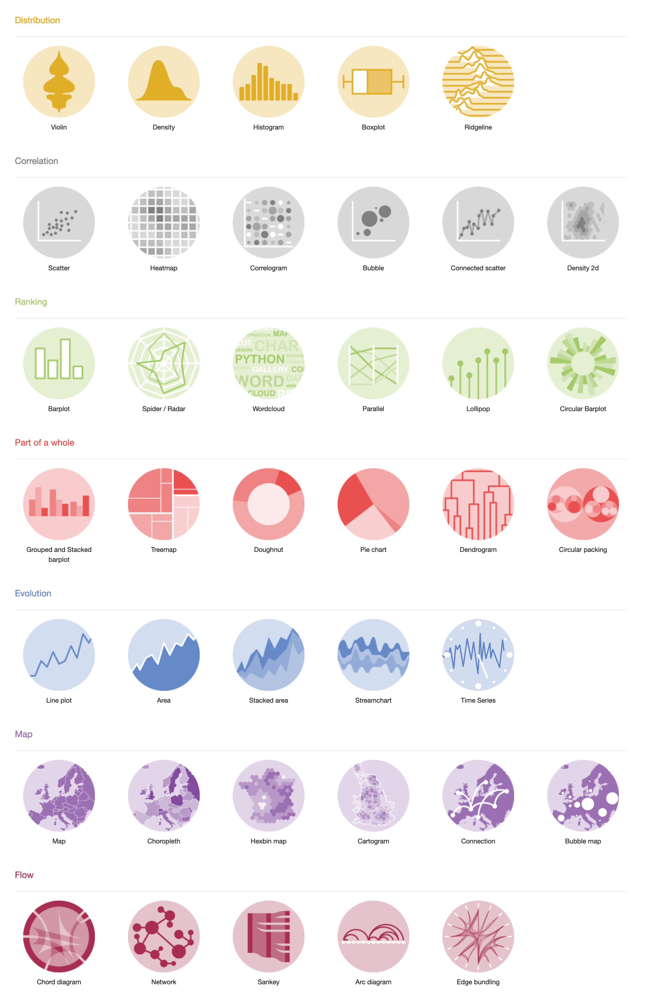
<div style="color:grey;text-align:right">Übersicht über die <a href="https://r-graph-gallery.com/index.html">R Graph Gallery</a></div><br />

> Kennt ihr einige dieser Diagramme vielleicht bereits aus den Medien, aus der Forschung oder aus eurem Studium? 

Wir wollen zunächst ein Streudiagramm (*scatter plot*) erzeugen. Dafür können wir die Funktion [`geom_point()`](https://ggplot2.tidyverse.org/reference/geom_point.html) benutzen.

In [ ]:
ggplot(
  data = penguins,
  mapping = aes(x = flipper_length_mm, y = body_mass_g)
) +
  geom_point()

[`ggplot2`](https://ggplot2.tidyverse.org/) hat uns ein Streudiagramm erzeugt. Es lässt sich auch direkt ein gewisser Zusammenhang zwischen `body_mass_g` und `flipper_length_mm` erkennen. Je größer die Flügellänge, desto größer scheint auch das Körpergewicht der Pinguine zu werden (das entspricht ja erstmal auch unserer intuitiven Erwartung). Wir können mehrere Erkenntnisse über den Zusammenhang der beiden Variablen erkennen:

* **positiv**: wenn sich die Flügellänge vergrößert, vergrößert sich auch das Körpergewicht
* relativ **linear**: die Punkte liegen alle ungefähr auf einer Linie und nicht auf einer Kurve
* einigermaßen **stark**: man kann sich vorstellen, dass alle Punkte in der Nähe einer Linie liegen, es gibt eher wenige Ausreißer.

Bevor wir unseren Plot verfeinern wollen, können wir ganz kurz nochmal die ausgegebene Warnung anschauen:

```
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
```

[`ggplot2`](https://ggplot2.tidyverse.org/) gibt diese Warnung aus, weil anscheinend bei 2 Pinguinen die Werte für das Körpergewicht und/oder die Flügellänge fehlen. Fehlende Datenpunkte werden uns bei den meisten Analysen begegnen. Aus den Sozialwissenschaften kennt man z. B., dass bei manchen Fragebögen nicht alle Fragen ausgefüllt werden, genauso gut können aber auch Sensordaten fehlen (durch einen technischen Ausfall) oder die Datenerhebung weist menschliche Fehler auf und es fehlen einfach Datenpunkte. Eine Warnung ist erstmal nicht weiter schlimm, sondern einfach nur ein Hinweis, dass z. B. etwas nicht ganz den Erwartungen von R entspricht. Wir müssen dann überlegen, wie die Warnung unsere Datenanalyse beeinträchtigen könnte und ob ein Handlungsbedarf besteht (z.B. wenn sehr viele Fälle nicht in der Analyse berücksichtigt werden können). 

> Wir können uns die Reihen mit fehlenden Werten natürlich auch ausgeben lassen. Dafür müssen wir allerdings Funktionen benutzen, die wir bisher noch nicht kennen, daher lassen wir das an dieser Stelle erstmal aus.

### Datenpunkte einfärben mit `color`

Streudiagramme sind nützlich, um direkte Zusammenhänge zwischen Variablen zu erkennen. Allerdings ist es immer sinnvoll, nochmal zu überlegen, ob es vielleicht noch weitere Zusammenhänge mit anderen Variablen gibt. Bei Pinguinen könnte man z. B. erwarten, dass vielleicht auch die Spezies für das Körpergewicht eine Rolle spielt. Dafür können wir die Variable `species` in verschiedenen Farben einfärben.

7. Müssen wir dafür [`aes()`](https://ggplot2.tidyverse.org/reference/aes.html) oder das **geom** verändern?

In [ ]:
ggplot(
    data = penguins,
    # für können eine Einfärbung mithilfe des Arguments color vornehmen
    mapping = aes(x = flipper_length_mm, y = body_mass_g, color = species)
) +
    geom_point()

Bisher haben wir grundlegende Funktionen von [`ggplot2`](https://ggplot2.tidyverse.org/) kennengelernt, ein erstes Streudiagramm erzeugt und sogar bereits mit *color coding*  eingefärbt. Im nächsten Teil werden wir andere Variablen von [`palmerpenguins`](https://allisonhorst.github.io/palmerpenguins/) in Bezug setzen und weitere Aspekte von [`ggplot2`](https://ggplot2.tidyverse.org/) kennenlernen.

## Präsenzteil

### Weitere Variablen explorieren

Um einen Datensatz umfassend zu explorieren, sollten (im besten Fall) alle Variablen mal untersucht werden. Wir könnten statt Körpergewicht und Flüggellänge im nächsten Schritt z.B. die Schnabellänge `bill_length_mm` mit der Schnabeltiefe `bill_depth_mm` vergleichen.

8. Welchen Zusammenhang erwartet ihr intutitiv zwischen den beiden Variablen?
9. Wie könnten diese beiden Variablen von `species` und `sex` abhängen?
10. Erstellt einen Plot, bei dem `bill_depth_mm` auf der x-Achse liegt und `bill_length_mm` auf der y-Achse:

In [ ]:
# hier kann Code eingefügt werden

Hm, das ist bisher noch nicht besonders hilfreich. Wir können aber mal wieder die Variable `species` einfärben.

Außerdem gibt es die Möglichkeit, der Funktion [`geom_point()`](https://ggplot2.tidyverse.org/reference/geom_point.html) das Argument `size` zu übergeben. Damit können wir die Größe der geplotteten Punkte verändern. Der Standardwert ist 1. 

In [ ]:
ggplot(
    data = penguins,
    mapping = aes(x = bill_depth_mm, y = bill_length_mm, color = species)
) +
    geom_point(size = 3)

Das sieht schon etwas besser aus. Wie wir sehen können, unterscheiden sich die 3 vorhanden Spezies ziemlich und bilden einzelne Häufungen, sogenannte *cluster*.

### Die Form verändern mit `shape`

Analog zur Farbe können wir auch die Form der Datenpunkte verändern. Dafür können wir [`aes()`](https://ggplot2.tidyverse.org/reference/aes.html) das Argument `shape` übergeben. Das definiert, welche Variable die Form der Datenpunkte bestimmt. Dadurch wird es möglich, vier Dimensionen in einem einzigen Streudiagramm darzustellen:

In [ ]:
ggplot(
    data = penguins,
    mapping = aes(x = bill_depth_mm, y = bill_length_mm, color = species, shape = sex)
) +
    geom_point(size = 3)

[`geom_point()`](https://ggplot2.tidyverse.org/reference/geom_point.html) gibt uns bei fehlenden Werten `NA` jedes Mal als Warnung aus, dass diese fehlenden Werte für das Diagramm entfernt wurden. Um die Warnung zu unterdrücken, können wir [`geom_point()`](https://ggplot2.tidyverse.org/reference/geom_point.html) explizit sagen, dass fehlende Werte entfernt werden sollen. Das funktioniert mit dem Argument `na.rm = TRUE`:

In [ ]:
ggplot(
    data = penguins,
    mapping = aes(x = bill_depth_mm, y = bill_length_mm, color = species, shape = sex)
) +
    geom_point(size = 3, na.rm = TRUE)

Das sieht doch schon ganz gut aus! Mithilfe des Diagramms können wir die weiter oben stehenden Fragen nun viel besser beantworten und Zusammenhänge zwischen den einzelnen Variablen erkennen.

11. Entspricht das Ergebnis euren intuitiven Vermutungen?
12. Welchen Zusammenhang erkennt ihr zwischen `bill_depth_mm` und `bill_length_mm` innerhalb der einzelnen Cluster (Spezies)?

### Beschriftungen mit [`labs()`](https://ggplot2.tidyverse.org/reference/labs.html) 

[`ggplot2`](https://ggplot2.tidyverse.org/) bietet natürlich auch die Möglichkeit, Diagramme umfangreich zu beschriften. Darauf werden wir später auch noch mehr eingehen, an dieser Stelle sei aber bereits die Funktion [`labs()`](https://ggplot2.tidyverse.org/reference/labs.html) erwähnt, mit der wir die wichtigsten Beschriftungen eines Diagrammes verändern können:

In [ ]:
ggplot(
    data = penguins,
    mapping = aes(x = bill_depth_mm, y = bill_length_mm, color = species, shape = sex)) +
    geom_point(size = 3, na.rm = TRUE) +
    labs(
        x = "Schnabelbreite (mm)", # x-Achsenbeschriftung
        y = "Schnabellänge (mm)", # y-Achsenbeschriftung
        color = "Spezies", # Legendenbeschriftung für `color`
        shape = "Geschlecht", # Legendbeschriftung für `shape`
        title = "Pinguine in der Antarktis", # Titel
        subtitle = "Aufgezeichnet von Dr. Kristen Gorman und der Palmer Station, Antarctica LTER", # Untertitel
        caption = "https://allisonhorst.github.io/palmerpenguins/" # Bildunterschrift
        )

Dieses Diagramm sieht schon ziemlich gut aus – durch die Beschriftung wird es auch für andere Menschen vermittelbar, die sich nicht so genau mit dem Datensatz auseinander gesetzt haben!

> Es ist immer sinnvoll, einen ansprechenden Titel zu wählen. Vermeide Titel, die lediglich das Diagramm beschreiben. Ein Diagrammtitel sollte die Leser:in catchen und gleichzeitig vermitteln, worum es geht!

### Ein Thema setzen mit [`theme()`](https://ggplot2.tidyverse.org/reference/theme.html)

Um Diagramme mit [`ggplot2`](https://ggplot2.tidyverse.org/) in einem bestimmten Style auszugeben, gibt es die Funktion [`theme`](https://ggplot2.tidyverse.org/reference/ggtheme.html). [`tidyverse`](https://www.tidyverse.org/) bietet einige grundlegende Themes an, wie z.B. [`theme_minimal()`](https://ggplot2.tidyverse.org/reference/ggtheme.html), was einen relativ schlichten Diagrammstyle erzeugt. Themes können beliebig [angepasst](https://ggplot2.tidyverse.org/reference/theme.html) werden. Fürs erste reicht uns aber, unser Diagramm mit [`theme_minimal()`](https://ggplot2.tidyverse.org/reference/ggtheme.html) auszugeben. Dafür fügen wir [`theme_minimal()`](https://ggplot2.tidyverse.org/reference/ggtheme.html) so wie alle bisherigen Komponenten mithilfe eines `+`-Operators am Ende unseres Plots hinzu:

In [ ]:
ggplot(
    data = penguins,
    mapping = aes(x = bill_depth_mm, y = bill_length_mm, color = species, shape = sex)) +
    geom_point(size = 3, na.rm = TRUE) +
    labs(
        x = "Schnabelbreite (mm)", # x-Achsenbeschriftung
        y = "Schnabellänge (mm)", # y-Achsenbeschriftung
        color = "Spezies", # Legendenbeschriftung für `color`
        shape = "Geschlecht", # Legendbeschriftung für `shape`
        title = "Pinguine in der Antarktis", # Titel
        subtitle = "Aufgezeichnet von Dr. Kristen Gorman und der Palmer Station, Antarctica LTER", # Untertitel
        caption = "https://allisonhorst.github.io/palmerpenguins/" # Bildunterschrift
        ) +
    theme_minimal()

Unser Diagramm ist jetzt erstmal fertig. Wir könnten es in dieser Form z. B. in einer Hausarbeit verwenden. Durch das Theme und die Beschriftung haben wir einen übersichtlichen Diagrammstyle erzeugt, und mithilfe des color codings und der Formen können wir schon einiges an Information aus den Daten visuell herauslesen.

**Fragen**

Auch hier könnt ihr gerne wieder mithilfe von Suchmaschinen oder KI arbeiten.


13. Was passiert, wenn Du ein Streudiagramm von `species` vs. `bill_depth_mm` erzeugst? Was könnte ein besseres **geom** sein, um dieses Verhältnis darzustellen?

14. Warum würde der folgende Code eine Fehlermeldung ausgeben? Und wie könnte man diese beheben?
```
ggplot(data = penguins) +
    geom_point()
```

15. Wie kann man die Schriftgröße oder die Schriftart des Plots verändern? Recherchiert mithilfe von Suchmaschinen oder ChatGPT, wie das möglich sein könnte.

16. Hypothetische Annahme: eine wichtige Kennzahl für Pinguin-Forscher:innen ist die Variable $xy$, welche sich durch die einfache Formel `body_mass_g / flipper_length_mm ** 2` berechnen lässt. Der Slash `/` funktioniert hier als Divisor und `**` als Potenz:
  
$ \frac{body\_mass\_g}{flipper\_length\_mm^2} $.

Verändert den Code, sodass die Farbe durch die neue Variable `xy` gegeben ist. Tipp: Ihr könnt eine neue Spalte mithilfe des `$`-Operators hinzufügen: `data_frame$new_column <- Berechnung`

## Grafiken speichern

Für die Weiterverarbeitung (z. B. in einer Projektarbeit) ist es wichtig, dass wir unsere erstellten Diagramme als Bilddatei abspeichern können. Dafür gibt es die Funktion [`ggsave()`](https://ggplot2.tidyverse.org/reference/ggsave.html) – diese speichert den zuletzt erstellten Plot im *working directory*. Wir können aber auch einen anderen Speicherort vorgeben.

> Das *working directory* ist in der Regel der Pfad, in dem das momentan benutzte Jupyter Notebook liegt. Es lässt sich über den Befehl `getwd()` abrufen und über `setwd(new_path)` ändern.

Es gibt ebenfalls die Möglichkeit, die Breite `width` und Höhe `height` des Plots zu definieren, oder z. B. die Auflösung `dpi` (steht für dots per inch). Wenn du dazu mehr nachlesen möchtest, schau gerne in die Dokumentation von [`ggsave()`](https://ggplot2.tidyverse.org/reference/ggsave.html).

In [ ]:
# Plot erstellen
ggplot(
    data = penguins,
    mapping = aes(x = bill_depth_mm, y = bill_length_mm, color = species, shape = sex)) +
    geom_point(size = 3, na.rm = TRUE) +
    labs(
        x = "Schnabelbreite (mm)", # x-Achsenbeschriftung
        y = "Schnabellänge (mm)", # y-Achsenbeschriftung
        color = "Spezies", # Legendenbeschriftung für `color`
        shape = "Geschlecht", # Legendbeschriftung für `shape`
        title = "Pinguine in der Antarktis", # Titel
        subtitle = "Aufgezeichnet von Dr. Kristen Gorman und der Palmer Station, Antarctica LTER", # Untertitel
        caption = "https://allisonhorst.github.io/palmerpenguins/" # Bildunterschrift
        ) +
    theme_minimal()

# Plot speichern
ggsave(
    filename = "penguin-plot.png",
    # path = "your/directory/",
    width = 2, # default in inches
    height = 2 # default in inches
    )

**Frage:**

17. Kannst du die Datei im File Browser finden und öffnen? Wie würde man sie auf deiner lokalen Festplatte (aka deinem Computer) speichern?

### Categorical bar plot

Bevor wir diese Übung abschließen, wollen wir noch eine weitere Art kennenlernen, um Daten zu visualisieren – das Balkendiagram (oder *bar plot*). Je nach Datentyp kann die Verteilung einer Variable unterschiedlich visualisiert werden. Bisher haben wir nur Streudiagramme erzeugt, die sich vor allem für die Darstellung von numerischen Variablen (also Zahlen) eignen. Im Allgemeinen wird oft zwischen **kategorischer** und **numerischer** Variable unterschieden. Eine Variable wird kategorisch genannt, wenn sie nur eine kleine Auswahl an Möglichkeiten annehmen kann, die Kategorien. Die Variable `penguins$species` ist beispielsweise kategorisch, weil es nur 3 verschiedene Spezies gibt, die vorkommen (`Adelie`, `Gentoo`, `Chinstrap`). Wir können die Verteilung der Pinguin-Spezies daher gut mit einem Balkendiagramm darstellen. Die Höhe der Balken bestimmt dabei, wie oft eine bestimmte Beobachtung vorkommt.

Ein Balkendiagramm mit [`ggplot2`](https://ggplot2.tidyverse.org/) zu erstellen funktioniert analog zum Streudiagramm. Wir benutzen jetzt als **geom**-Objekt die Funktion [`geom_bar()`](https://ggplot2.tidyverse.org/reference/geom_bar.html). Da die y-Achse die Häufigkeit (*count*) der kategorischen Variable auf der x-Achse anzeigt, müssen wir lediglich die x-Achse definieren.

In [ ]:
ggplot(penguins, aes(x = species)) +
  geom_bar()

Voilà. Dieser Plot hilft uns ebenfalls, weitere Informationen über den Datensatz zu erhalten.

18. Auch wenn es trivial erscheinen mag, was sagt dieser Plot über den Datensatz aus?

Wie zuvor können wir in dem Diagramm auch eine weitere Variable über die Verfärbung der Balken darstellen. Das passiert bei einem Balkendiagramm mithilfe des `fill`-Arguments.

In [ ]:
ggplot(penguins, aes(x = species, fill = island)) +
    geom_bar()

Dadurch wird unser Plot direkt wesentlich aussagekräftiger. Was erfahren wir aus dem Plot über die Pinguine und ihre Verbreitungssgebiete?

19. Füge mithilfe von [`labs()`](https://ggplot2.tidyverse.org/reference/labs.html) aussagekräftige Beschriftungen hinzu.
20. Füge eine Theme hinzu, z.B. mit [`theme_minimal()`](https://ggplot2.tidyverse.org/reference/ggtheme.html). Ihr könnt auch andere [Themes](https://ggplot2.tidyverse.org/reference/ggtheme.html) ausprobieren!

Für manche Darstellungen ist es wichtig, dass wir einen *relative frequency plot* verwenden. Damit können wir die relative Verteilung einer weiteren Variable innerhalb jeder Kategorie darstellen. Dafür kann der Funktion [`geom_bar()`](https://ggplot2.tidyverse.org/reference/geom_bar.html) das Argument `position = "fill"` übergeben werden. So können wir beispielsweise feststellen, dass das Geschlecht der Pinguine `penguins$sex` relativ gleichmäßig verteilt ist. Manchmal ist es hilfreich, die Schriftgröße der Beschriftungen festzulegen. Dabei hilft das Argument `base_size`, welches wir Theme übergeben können:

In [ ]:
ggplot(penguins, aes(x = species, fill = sex)) +
    geom_bar(position = "fill") +
    labs(x = "Spezies", y = "Schnabellänge (mm)", fill = "Sex", title = "Pinguine in der Antarktis") +
    theme_minimal(base_size = 20)

[`geom_bar()`](https://ggplot2.tidyverse.org/reference/geom_bar.html) kann viele verschiedene Argumente übergeben bekommen. Eine ausführliche Beschreibung findet sich in der dazugehörigen [Dokumentation](https://ggplot2.tidyverse.org/reference/geom_bar.html). 

> Der Vollständigkeit halber sei hier noch die Funktion [`geom_col()`](https://ggplot2.tidyverse.org/reference/geom_bar.html) erwähnt. Sie funktioniert genauso wie [`geom_bar()`](https://ggplot2.tidyverse.org/reference/geom_bar.html), gibt allerdings ein um 90° im Uhrzeigersinn gedrehtes (horizontales) Balkendiagramm aus!

## Zusammenfassung

Wenn du mit R anfängst, wirst du wahrscheinlich auf Probleme stoßen. Mach dir keine Sorgen – das passiert allen! Auch die erfahrensten Programmier:innen schreiben jeden Tag Code, der nicht auf den ersten Versuch funktioniert! Wenn du Code ausführst und eine Fehlermeldung erhältst, achte sorgfältig auf die **richtige Schreibweise**. Ein Computer kann ein fehlplatziertes Zeichen nicht so deuten wie ein Mensch und braucht immer den korrekten Code, um zu funktionieren. Stelle sicher, dass jede `(` mit einer `)` und jedes `"` mit einem anderen `"` gepaart ist. Gerade bei [`ggplot2`](https://ggplot2.tidyverse.org/)-Grafiken musst Du auch das `+` überprüfen! Es muss am Ende jeder Zeile stehen, außer der letzten!

Wenn du immer noch feststeckst, versuche es mit der **Hilfe**. Du kannst Hilfe zu jeder R-Funktion erhalten, indem du `?function_name()` in der Konsole ausführst oder mit einer Suchmaschine danach suchst. Mach dir keine Sorgen, wenn die Hilfe nicht so hilfreich erscheint - springe stattdessen zu den Beispielen und suche nach Code, der dem entspricht, was du tun möchtest. Wenn das nicht hilft, lies die Fehlermeldung sorgfältig durch, manchmal ist die Antwort dort vergraben! Aber wenn du neu in R bist, selbst wenn die Antwort in der Fehlermeldung steht, weißt du vielleicht noch nicht, wie du sie verstehen kannst.

Und immer: **Suchmaschinen** wie Google oder generative KI wie **ChatGPT** kann auch oft bei Fehlern helfen! Gerade am Anfang und bei einfachen Fehlermeldungen ist das extrem nützlich!

In diesem Kapitel haben wir einen kleinen Einstieg in die Erstellung von Grafiken mit [`ggplot2`](https://ggplot2.tidyverse.org/) bekommen. Wir werden später sehen, dass mit [`ggplot2`](https://ggplot2.tidyverse.org/) auch noch wesentlich umfangreichere Grafiken erstellt werden können. Für den Anfang reicht das aber erstmal!

### Cheat-Sheet

Auch [`ggplot2`](https://ggplot2.tidyverse.org/) hat ein eigenes [Cheat-Sheet](https://rstudio.github.io/cheatsheets/html/data-visualization.html). Wir haben in dieser Übung die grundlegenden Aspekte von [`ggplot2`](https://ggplot2.tidyverse.org/) kennengelernt, und auf den Cheat-Sheets sieht man, dass es noch sehr viele weitere Funktionen gibt. Keine Sorge, ihr müsst die Cheat-Sheets nicht komplett lesen. Ihr könnt sie aber gerne einmal überfliegen und falls ihr später im Verlauf der Übung nochmal genauer draufschaut, umso besser!

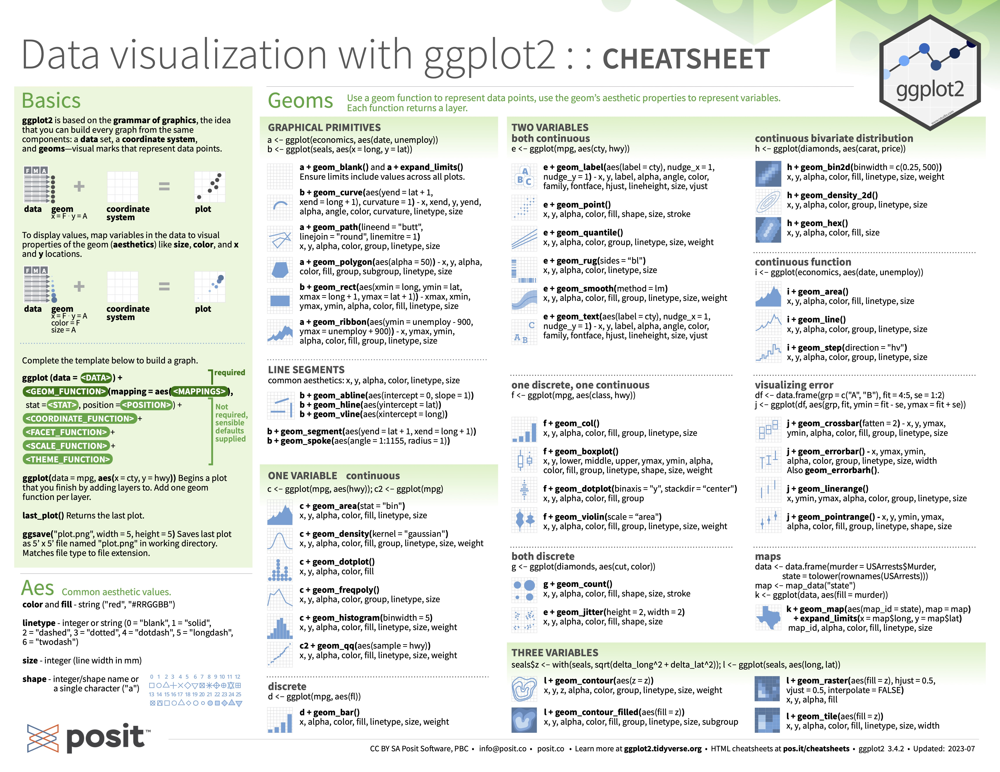

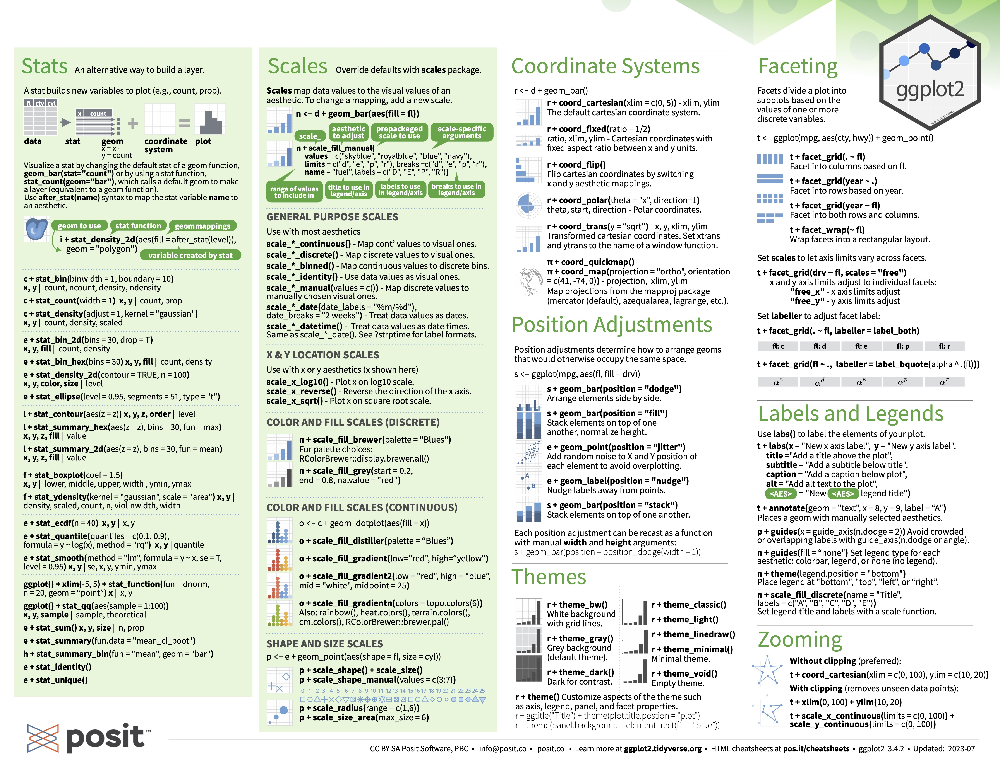

## Weiterführend: Weitere Möglichkeiten durch Anpassung des `geom`

Im Folgenden sind noch einige weitere Beispiele über Möglichkeiten der Visualisierung mit [`ggplot2`](https://ggplot2.tidyverse.org/) aufgeführt. Diese sind optional und ergänzend gedacht, wenn du also z.  B. gerade keine Kapazitäten hast, dann kannst du an dieser Stelle auch aufhören oder folgenden Text nur kurz überfliegen.

### Bar plot sortieren

Für eine bessere Übersichtlichkeit können wir die Balken in absteigender Reihenfolge sortieren. Dafür können wir die Variable `species` mithilfe der Funktion [`fct_infreq()`](https://forcats.tidyverse.org/reference/fct_inorder.html) sortieren. Mehr zu der Funktion [`fct_infreq()`](https://forcats.tidyverse.org/reference/fct_inorder.html) findet sich in der [Dokumentation](https://forcats.tidyverse.org/reference/fct_inorder.html). Darauf werden wir hier nicht weiter eingehen.

In [ ]:
ggplot(penguins, aes(x = fct_infreq(species))) +
    geom_bar()

### Numerical bar plot (histogram)

Wenn eine Variable eine sehr große Spanne an numerischen Werten hat, wird sie als numerische Variable bezeichnet. Mit numerischen Variablen lässt sich rechnen (z. B. der Durchschnitt bilden). Wir können auch numerische Variablen visuell ähnlich zu einem Balkendiagramm darstellen. In der Statistik wird diese Darstellung meistens **Histogramm** genannt. Mit einem Histogramm wird die x-Achse in gleichmäßige Bereiche aufgeteilt, und für jeden Bereich ein Balken dargestellt, der z. B. analog wie oben die Häufigkeit der Beobachtung darstellt. Ein Histogramm können wir mit [`geom_histogram()`](https://ggplot2.tidyverse.org/reference/geom_histogram.html) erzeugen:

In [ ]:
ggplot(penguins, aes(x = body_mass_g)) +
  geom_histogram(binwidth = 200)

`binwidth = 200` definiert hier die Breite der einzelnen Bereiche. Das Diagramm zeigt uns die Verteilung des Körpergewichts der Pinguine. So fallen z. B. 39 Beobachtungen von `body_mass_g` in den Bereich zwischen 3500 und 3700 Gramm. Bei der Verwendung von Histogrammen lohnt es sich, verschiedene Werte für `binwidth` auszuprobieren. Je nach Größe kann der Plot unterschiedlich aussehen.

> Achtung! Mit Balkendiagramm und Histogramm sind zwei unterschiedliche Diagrammtypen gemeint. Ein Histogramm wird i.d.R. für die Darstellung der Verteilung kontinuierliche Parameter (also z. B. für die Variable `body_mass_g`) benutzt. Ein Balkendiagramm wird dann genutzt, wenn kategorische Daten visualisiert werden sollen (also z. B. für die Variable `species`).

### Density plot

Eine alternative Darstellung zu Histogrammen sind sogenannte **Dichteverteilungen** (*density plots*). Eine Dichteverteilung ist im Prinzip ein geglättetes Histogramm und kann vor allem aus großen Datenmengen abgeleitet werden. In der Dokumentation von [`geom_density()`](https://ggplot2.tidyverse.org/reference/geom_density.html) wird beschrieben, wie diese Dichteverteilung exakt ermittelt wird.

In [ ]:
ggplot(penguins, aes(x = body_mass_g)) +
  geom_density()

### Abschluss

[`ggplot2`](https://ggplot2.tidyverse.org/) kennt viele weitere Diagrammtypen. Nochmal erwähnt sei die Webseite [The R Graph Gallery](https://r-graph-gallery.com/index.html), bei der zu jeder Art der Visualisierung auch bereits Code-Snippets gegeben sind. Im Verlauf der Übungen werden wir auch weitere Diagrammtypen näher kennenlernen. Häufig kann es inspirierend sein, sich anzuschauen, wie andere Wissenschaftler:innen Daten visualisieren. Es gibt dafür auch gute Webseiten, wie z.B. [Our World in Data](https://ourworldindata.org/), auf denen man sich inspirieren lassen kann.